<span style='color:gray'> Author: Glicerio Vergara.</span>

*https://www.linkedin.com/in/glicerio-vergara*
___
# <span style='color:DarkBlue'> Analysis of the Chemical Engineering Job Market </span>  
___

The project aims to give an overview to the job opportunities in the Chemical Engineer industry in Germany according to their location, company which offers it and language requirements. The program combines different technologies such as Web Scraping, K-mean clustering, API Requests and Text mining in the form of WordCloud and sting extraction with the aim to carry out an analysis of the job market.

### <span style='color:DarkBlue'>  Import the libraries and Data </span>  

In [1]:
import requests
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from datetime import datetime 
import time 

### <span style='color:DarkBlue'> Web scrap data from *companylist.org* </span>  

In [ ]:
# Select the website where the information is extracted
url = "https://companylist.org/Germany/Keywords/chemical/?sort=n"
# Ask for permision
response = requests.get(url)
# Parse the HTML document from the source code using BeautifulSoup
html = BeautifulSoup(response.text, 'html.parser')
# Search for specific html code
cards = html.find_all('span',{'class':'result-txt'})
# len (card)
card=cards[0]

# Declare a function to scrap specific data
def get_record(card):
    namecompany = card.find('span','result-name').text.strip()
    name_city_addrs = card.find('em').text.strip()

    record = (namecompany,name_city_addrs)

    return record
# Create and fill the information from the website for the first page
records = []
for card in cards:
    record = get_record(card)
    records.append(record)

# Extract all the information from the website by a loop 
while True:
    try:
        url = "https://companylist.org/" + html.find('a',{'rel':'next'}).get('href')
    except AttributeError:
        break
    response = requests.get(url)
    html = BeautifulSoup(response.text, 'html.parser')
    cards = html.find_all('span', {'class': 'result-txt'})
    
    for card in cards:
            record = get_record(card)
            records.append(record) 
# Data preparation
records_df = pd.DataFrame (records,columns=['Company_name','Company_addrs'],dtype=str)
Company_name = records_df.Company_name.str.split("\n",expand=True,)
company_name=Company_name[0]
Company_name = pd.DataFrame(company_name)
Company_name.columns =['Company']
Company_City_addrs = records_df.Company_addrs.str.split("\n",expand=True,)
Company_City_addrs.columns =['City','Addrs']
Company_City_addrs['zip'] = Company_City_addrs['Addrs'].str.extract(r'(\d{5}\-?\d{0,4})')
Company_Name_City_addrs=pd.concat([Company_name, Company_City_addrs],axis=1)
Company_Name_City_addrs = Company_Name_City_addrs.convert_dtypes()

### <span style='color:DarkBlue'> Obtain the lat and lng from zipcode and citydata by  *Developer.Mapquest* </span>  

In [2]:
Company_Name_City_addrs=pd.read_csv('Company list from companylist.csv',dtype=str)
Company_Name_City_addrs=Company_Name_City_addrs[pd.isnull(Company_Name_City_addrs['zip']) == False]
Company_Name_City_addrs['lat']=""
Company_Name_City_addrs['lng']=""

In [ ]:
import json

for i, row in Company_Name_City_addrs.iterrows():
    
    apiAddress = str(str(Company_Name_City_addrs.at[i,'zip'])+','+str(Company_Name_City_addrs.at[i,'City'])+','+"Germany")
    
    parameters = {
        "key": "enter your mapquestapi key here",
        "location": apiAddress
    }

    response = requests.get("http://www.mapquestapi.com/geocoding/v1/address", params=parameters)
    data = response.text
    dataJ = json.loads(data)['results']
    lat = (dataJ[0]['locations'][0]['latLng']['lat'])
    lng = (dataJ[0]['locations'][0]['latLng']['lng'])
    
    Company_Name_City_addrs.at[i,'lat'] = lat
    Company_Name_City_addrs.at[i,'lng'] = lng

In [2]:
Company_Name_City_addrs=pd.read_csv('Company list from companylist with lat and lng_ne.csv',dtype=str)
Company_Name_City_addrs

,Company,City,Addrs,zip,lat,lng
0,Schwendinger Brennstoffe Gmbh,Kempten (Allgäu),87561 Oberstdorf,87561,47.408561,10.275793
1,Geigertechnikgesellschaftmitbeschrankterhaftung,Garmisch-Partenkirchen,Breitenau Pf 1354 82467 Garmisch-partenkirchen,82467,47.492343,11.086231
2,Alpin Chemie Gmbh,Kempten (Allgäu),Hindelanger Str. 29 87527 Sonthofen,87527,47.495737,10.238323
3,Sanosil-service Gmbh,Garmisch-Partenkirchen,Ettaler Str. 4 82490 Farchant,82490,47.530252,11.112124
4,Avendris Gmbh,Lörrach,Gewerbestr. 18 79639 Grenzach-wyhlen,79639,47.552781,7.66112
...,...,...,...,...,...,...
4024,Agravis Technik Meppen Gmbh,Nordhorn,Emmener Str. 1 49716 Meppen,49716,54.87677,8.67329
4025,Aik Industrie Gmbh,Kassel,Otto-hahn-str. 5 Pf 100123 34123 Kassel,100123,54.98742,8.36429
4026,Honsel Mineralolvertriebs Gmbh,Kassel,Am Weinberg 22 34593 Knullwald,34593,54.98742,8.36429
4027,Marquard Chemie Gmbh,Kassel,Mundener Str. 24 37218 Witzenhausen,37218,54.98742,8.36429


### <span style='color:DarkBlue'> Visualize location data from *companylist.org* </span>  

In [6]:
import folium
from folium import FeatureGroup
from folium.plugins import MarkerCluster

map_germany = folium.Map(location=[50.00, 6.00],zoom_start=6)

markerCluster = MarkerCluster().add_to(map_germany)

for i, row in Company_Name_City_addrs.iterrows():
    lat = Company_Name_City_addrs.at[i,'lat']
    lng = Company_Name_City_addrs.at[i,'lng']

    popup = Company_Name_City_addrs.at[i,'Company'] +'<br>'+ str(Company_Name_City_addrs.at[i, 'zip'])

    folium.Marker(location=[lat, lng],popup=popup, icon=folium.Icon(color='blue')).add_to(markerCluster)
map_germany

### <span style='color:DarkBlue'> K-Mean cluster data by location from *companylist.org* </span>  

In [7]:
# Structuring the data
x = Company_Name_City_addrs.iloc[:, [4,5]].values

# Loading the k-mean library
from sklearn.cluster import KMeans

# Creating list to insert the result from the K-mean loop
wcss = []

# K-mean loop
for i in range(1, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', 
                    max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)

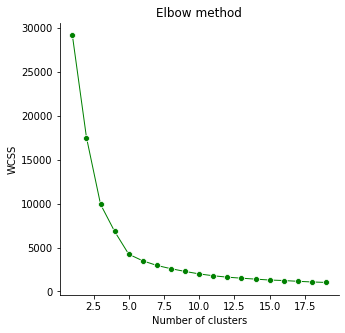

The optimal number of cluster is 5


In [8]:
wcss = pd.DataFrame(wcss,columns =['wcss'])
wcss['Number of clusters']=range(1, 20)

plt.figure(figsize=(5, 5))
sns.lineplot(data=wcss, x="Number of clusters", y="wcss", color = 'green', linewidth=1,marker='o')
sns.despine()

plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

print ("The optimal number of cluster is 5")

In [9]:
# Applying kmeans to the dataset / Creating the kmeans classifier
kmeans = KMeans(n_clusters = 5, init = 'k-means++',max_iter = 300, n_init = 10, random_state = 0)
y_kmeans = kmeans.fit_predict(x)

Y_kmeans = pd.DataFrame(y_kmeans,columns =['Cluster_Labels'])
Company_Name_City_addrs=pd.concat([Company_Name_City_addrs, Y_kmeans],axis=1)

In [190]:
Company_Name_City_addrs

,Company,City,Addrs,zip,lat,lng,Cluster_Labels
0,Schwendinger Brennstoffe Gmbh,Kempten (Allgäu),87561 Oberstdorf,87561,47.408561,10.275793,0
1,Geigertechnikgesellschaftmitbeschrankterhaftung,Garmisch-Partenkirchen,Breitenau Pf 1354 82467 Garmisch-partenkirchen,82467,47.492343,11.086231,0
2,Alpin Chemie Gmbh,Kempten (Allgäu),Hindelanger Str. 29 87527 Sonthofen,87527,47.495737,10.238323,0
3,Sanosil-service Gmbh,Garmisch-Partenkirchen,Ettaler Str. 4 82490 Farchant,82490,47.530252,11.112124,0
4,Avendris Gmbh,Lörrach,Gewerbestr. 18 79639 Grenzach-wyhlen,79639,47.552781,7.66112,4
...,...,...,...,...,...,...,...
4024,Agravis Technik Meppen Gmbh,Nordhorn,Emmener Str. 1 49716 Meppen,49716,54.87677,8.67329,3
4025,Aik Industrie Gmbh,Kassel,Otto-hahn-str. 5 Pf 100123 34123 Kassel,100123,54.98742,8.36429,3
4026,Honsel Mineralolvertriebs Gmbh,Kassel,Am Weinberg 22 34593 Knullwald,34593,54.98742,8.36429,3
4027,Marquard Chemie Gmbh,Kassel,Mundener Str. 24 37218 Witzenhausen,37218,54.98742,8.36429,3


### <span style='color:DarkBlue'> Visualize K-mean cluster results from *companylist.org* </span>  

In [189]:
Germany_map = folium.Map(location=[50.00, 6.00],zoom_start=6,tiles='Stamen Toner')

companies = folium.map.FeatureGroup()

for lat, lng, Cst in zip(Company_Name_City_addrs.lat, Company_Name_City_addrs.lng,Company_Name_City_addrs.Cluster_Labels):

    if Cst == 1:
        color = '#404387'
    elif Cst == 2:
        color = '#29788E'
    elif Cst == 3:
        color = '#22A784'
    elif Cst == 4:
        color = '#79D151'
    else:
        color = '#FDE724'

    companies.add_child(
    folium.features.CircleMarker(
    [lat, lng], # longitude and latitude value of crimes
    radius=1, # define how big you want the circle markers to be
    color= color, # color of marker
    #fill=True, # if you want to fill secondary color
    #fill_color='yellow', # inner color of marker
    #fill_opacity=1 # visibility of inner color
    )
    )
    Germany_map.add_child(companies) # Adding all the incidents to map.
Germany_map

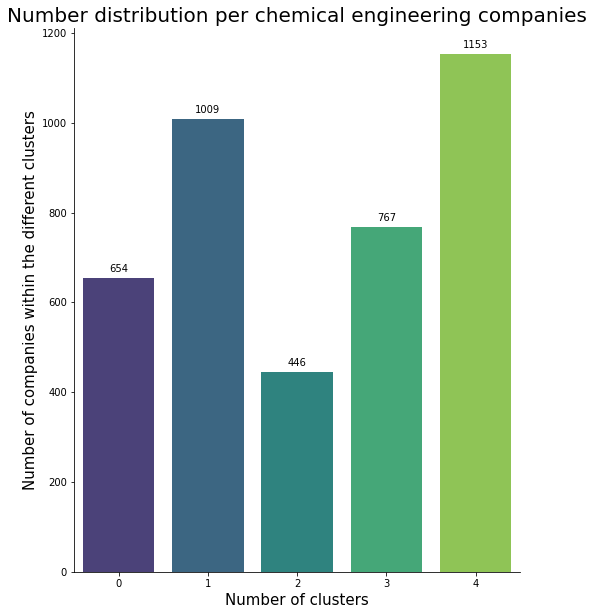

In [208]:
N_custers=Company_Name_City_addrs.groupby('Cluster_Labels')['Company'].count().sort_values(ascending=False)
N_custers = pd.DataFrame (N_custers)
N_custers['Cluster'] = N_custers.index
N_custers.reset_index(drop=True, inplace=True)
N_custers

plt.figure(figsize=(8, 10))
splot=sns.barplot(x="Cluster", y="Company", data=N_custers,palette="viridis")
sns.despine()
plt.title('Number distribution per chemical engineering companies',size=20)
plt.xlabel('Number of clusters',size=15)
plt.ylabel('Number of companies within the different clusters',size=15)

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.show()

### <span style='color:DarkBlue'> Web scrap Job information data from *de.indeed.com* </span>  

In [ ]:
def get_url(position,location,langage):
    #generate a url from position location and language
    template='https://de.indeed.com/Jobs?q={}&l={}&lang={}'
    url = template.format(position,location,langage)
    return url

In [ ]:
# Specified seach by position,location and language

url = get_url ('process','Deutschland','en')

# Ask for permission
response = requests.get(url)
# Parse the HTML document from the source code using BeautifulSoup
html = BeautifulSoup(response.text, 'html.parser')
# Search for specific html code
cards = html.find_all('div',{'class':'jobsearch-SerpJobCard'})

card=cards[0]

In [113]:
# Declare a function to scrap specific data
def get_record(card):
    atag = card.h2.a 
    job_title= atag.get('title')
    job_url = 'https://de.indeed.com'+ atag.get('href')
    try:
        company_name=card.find('span','company').text.strip()
    except AttributeError:
        company_name='N/A'
    company_city = card.find('div','recJobLoc').get('data-rc-loc')
    job_summary= card.find('div','summary').text.strip()
    post_date = card.find('span','date').text
    today = datetime.today().strftime('%Y-%m-%d')
    job_id= card.find('div','recJobLoc').get('id')
    try:
        job_rateing=card.find('span','ratingsContent').text.strip()
    except AttributeError:
        job_rateing='N/A'
        
    record = (job_title,company_name,company_city,job_summary,post_date,today,job_id,job_url)

    return record
# Create and fill the information from the website for the first page
records_indeed = []
for card in cards:
    record = get_record(card)
    records_indeed.append(record)

In [114]:
# Extract all the information from the website by a loop 
while True:
    try:
        url = "https://de.indeed.com" + html.find('a',{'aria-label':'Weiter'}).get('href')
    except AttributeError:
        break
    time.sleep(1)
    response = requests.get(url)
    html = BeautifulSoup(response.text, 'html.parser')
    cards = html.find_all('div',{'class':'jobsearch-SerpJobCard'})
    
    for card in cards:
            record = get_record(card)
            records_indeed.append(record) 

In [115]:
# Data preparation
records_indeed_df = pd.DataFrame (records_indeed,columns=['Job Title','Company Name','Company City','Job Summary','Date Posted','Day extracted','Job id',"Job Url"],dtype=str)
records_indeed_df = records_indeed_df.convert_dtypes()
records_indeed_df['Date Posted'] = records_indeed_df['Date Posted'].str.replace("Heute","0")
records_indeed_df['Date Posted'] = records_indeed_df['Date Posted'].str.replace("Gerade geschaltet","0")
records_indeed_df['Date Posted']=records_indeed_df['Date Posted'].str.extract(r'(\d{1}\-?\d{0,2})')
records_indeed_df['Date Posted'] = records_indeed_df['Date Posted'].astype(int)

### <span style='color:DarkBlue'> Web scrap Job decription data from *de.indeed.com* </span>  

In [117]:
records_indeed_id=records_indeed_df['Job id']
records_indeed_id= records_indeed_id.str.split("recJobLoc_",expand=True)
records_indeed_id.columns =['Id1','Id2']
records_indeed_id= records_indeed_id['Id2']

In [12]:
def get_url(Id):
    # Generate a url from position location and language
    template='https://de.indeed.com/Zeige-Job?jk={}'
    url = template.format(Id)
    return url

In [ ]:
Trail=[]
for i in range (0,len (Job_list_id)):
    y=0+i
    Id=Job_list_id[y]
    url = get_url (Id)
    if pd.isnull(Id) == False:
        # Add witing time
        time.sleep(0.5)
        # Ask for permission
        response = requests.get(url)
        # Parse the HTML document from the source code using BeautifulSoup
        html = BeautifulSoup(response.text, 'html.parser')
        # Search for specific html code
        try:
            cards = html.find('div',{'class':'jobsearch-jobDescriptionText'})
            Textdescription=cards.find_all('li')
        except AttributeError:
            break
        Trail.append(Textdescription)
    else :
        Trail.append("")
    i=i+1

In [ ]:
# Clean data
List_indeed_desc = pd.DataFrame (Trail)
List_indeed_desc=List_indeed_desc[List_indeed_desc.columns[1:]].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
List_indeed_desc = pd.DataFrame (List_indeed_desc)
List_indeed_desc.columns=['Job_desc']
List_indeed_desc['Job_desc'] = List_indeed_desc['Job_desc'].str.replace("<li>\n"," ")
List_indeed_desc['Job_desc'] = List_indeed_desc['Job_desc'].str.replace("</li>"," ")
List_indeed_desc['Job_desc'] = List_indeed_desc['Job_desc'].str.replace("<li>"," ")

In [5]:
Indeen_job_list

,Job Title,Company Name,Company City,Job Summary,Date Posted,Day extracted,Job id,Job Url,lat,lng,admin_name,capital,population,Job_desc
0,Trainee (m/w/d) Chemical Engineering - Career ...,Hexion Inc.,Duisburg,Have no more than 2 years of working experienc...,30,4/2/21,recJobLoc_0e8cc597234c9cec,https://de.indeed.com/pagead/clk?mo=r&ad=-6NYl...,51.4322,6.7611,North Rhine-Westphalia,minor,498590.0,"Production,Manufacturing,Projects &amp; Engine..."
1,Market Research Analyst m/w/d,Carter Murray,Düsseldorf,"Very good technical understanding, preferably ...",1,4/2/21,recJobLoc_d43a14586981132a,https://de.indeed.com/pagead/clk?mo=r&ad=-6NYl...,51.2311,6.7724,North Rhine-Westphalia,admin,619294.0,"Measure the actual market and consumer trends,..."
2,BASF “GROW” Graduate Program –Marketing,BASF,Krefeld,"We are a leading chemical company, with the be...",30,4/2/21,recJobLoc_c5ac86dd7e47d03a,https://de.indeed.com/rc/clk?jk=c5ac86dd7e47d0...,51.3333,6.5667,North Rhine-Westphalia,minor,227020.0,NaN
3,Graduate Employment Opportunities - Germany 2021,Shell,Hamburg,Are you in the final year of your studies or g...,30,4/2/21,recJobLoc_6249d93ffd5f4bd5,https://de.indeed.com/rc/clk?jk=6249d93ffd5f4b...,53.5500,10.0000,Hamburg,admin,1841179.0,"Networking, Coaching and Mentoring relationshi..."
4,Graduate Mechanical/Chemical Engineer - Germany,Air Products,Berlin,Our European Graduate Programme is a strategic...,30,4/2/21,recJobLoc_409d953a17532240,https://de.indeed.com/rc/clk?jk=409d953a175322...,52.5167,13.3833,Berlin,primary,3644826.0,In your final year or have recently graduated ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1220,"Internship – Recruiting, Talent Marketing (all...",AUDI AG,Neckarsulm,You independently process incoming inquiries f...,3,4/2/21,recJobLoc_ded473c03af62ba3,https://de.indeed.com/rc/clk?jk=ded473c03af62b...,49.1917,9.2244,Baden-Württemberg,NaN,26492.0,You support the recruiting team in directly ad...
1221,(Junior) Marketing Manager (w/m/d),Rhenus Warehousing Solutions SE & Co. KG,Holzwickede,"As a Global Marketing Manager, you actively co...",1,4/2/21,recJobLoc_d7eedf5d7945b8ea,https://de.indeed.com/rc/clk?jk=d7eedf5d7945b8...,NaN,NaN,NaN,NaN,NaN,"This includes keeping an eye on market trends,..."
1222,Self-Driving Cars Administrator (Israel),Yandex,Berlin,Take care of the project documents workflow in...,30,4/2/21,recJobLoc_bfa6539b918f2da1,https://de.indeed.com/rc/clk?jk=bfa6539b918f2d...,52.5167,13.3833,Berlin,primary,3644826.0,"responsible and able to meet tight deadlines;,..."
1223,Customer Care & Fashion Advisor Chinese (f/m/d),mytheresa.com,München,Advisory and support services for our internat...,30,4/2/21,recJobLoc_b1229946ba1393ff,https://de.indeed.com/rc/clk?jk=b1229946ba1393...,NaN,NaN,NaN,NaN,NaN,Answering to customer requests (phone calls an...


### <span style='color:DarkBlue'> Descriptive analytics </span>  

In [169]:
 print ("There are the following number of job offer:")
 Indeen_job_list['Job Title'].count()

There are the following number of job offer:


819

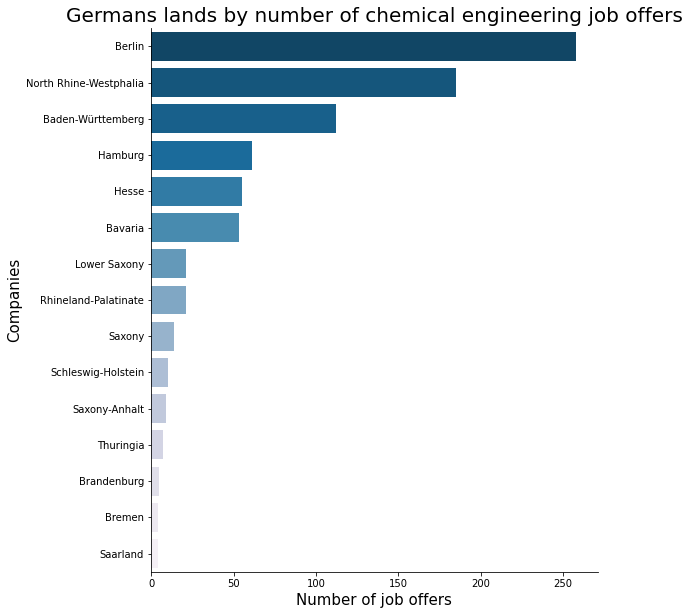

In [9]:
Toplands=Indeen_job_list.groupby('admin_name')['Job Title'].count().sort_values(ascending=False)
Toplands = pd.DataFrame (Toplands)
Toplands = Toplands.rename(columns = {'Job Title':'N_job'})
Toplands['Company_land'] = Toplands.index
Toplands.reset_index(drop=True, inplace=True)
Toplands

plt.figure(figsize=(8, 10))
splot=sns.barplot(x="N_job", y="Company_land", data=Toplands,  palette="PuBu_r")
sns.despine()
plt.title('Germans lands by number of chemical engineering job offers',size=20)
plt.xlabel('Number of job offers',size=15)
plt.ylabel('Companies',size=15)
plt.show()

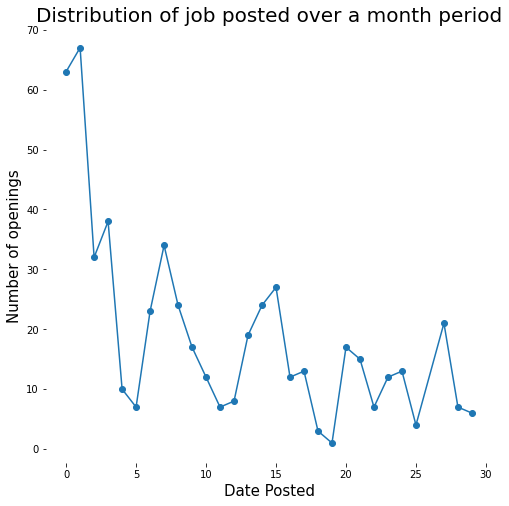

In [86]:
plt.figure(figsize=(8, 8))
plt.title('Distribution of job posted over a past month period',size=20)
plt.xlabel('Days',size=15)
plt.ylabel('Number of openings',size=15)
Indeen_job_list[(Indeen_job_list['Date Posted']) < 30].groupby('Date Posted')['Company Name'].count().plot(marker='o')
plt.box(False)
plt.show()

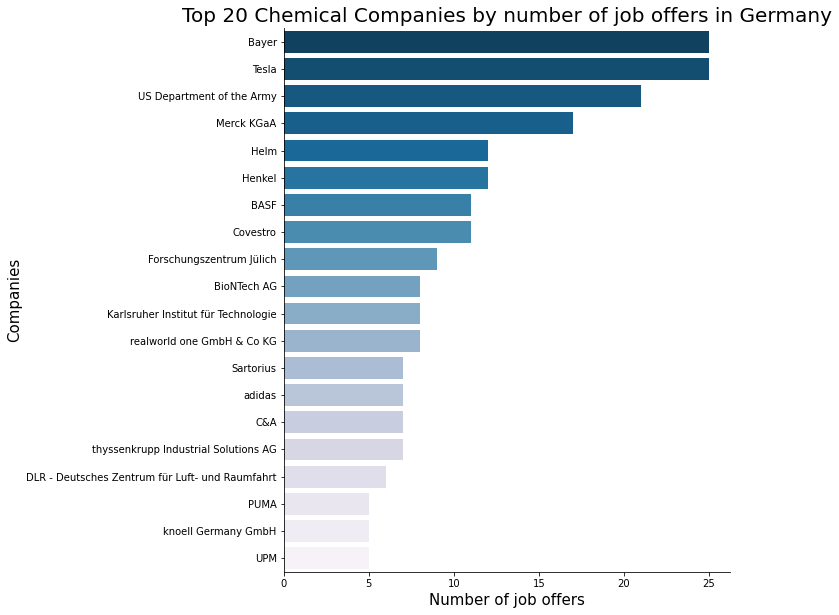

In [113]:
topcompaniesbywork=Indeen_job_list.groupby('Company Name')['Job Title'].count().sort_values(ascending=False)[:20]
topcompaniesbywork = pd.DataFrame (topcompaniesbywork)
topcompaniesbywork = topcompaniesbywork.rename(columns = {'Job Title':'N_job'})
topcompaniesbywork['Company_name'] = topcompaniesbywork.index
topcompaniesbywork.reset_index(drop=True, inplace=True)
topcompaniesbywork

plt.figure(figsize=(8, 10))
splot=sns.barplot(x="N_job", y="Company_name", data=topcompaniesbywork,  palette="PuBu_r")
sns.despine()
plt.title('Top 20 Chemical Companies by number of job offers in Germany',size=20)
plt.xlabel('Number of job offers',size=15)
plt.ylabel('Companies',size=15)
plt.show()

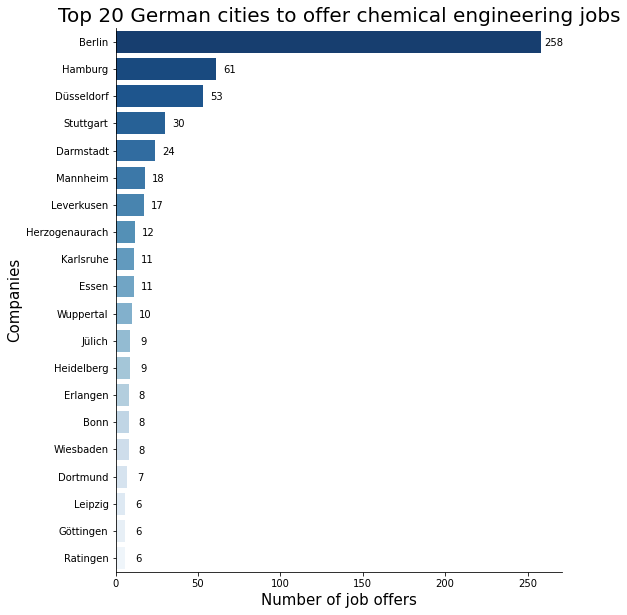

In [137]:
topcompaniesbycity=Indeen_job_list.groupby('Company City')['Company Name'].count().sort_values(ascending=False)[:20]
topcompaniesbycity = pd.DataFrame (topcompaniesbycity)
topcompaniesbycity = topcompaniesbycity.rename(columns = {'Company Name':'N_job'})
topcompaniesbycity['Company_city'] = topcompaniesbycity.index
topcompaniesbywork.reset_index(drop=True, inplace=True)
topcompaniesbycity

plt.figure(figsize=(8, 10))
splot=sns.barplot(x="N_job", y="Company_city", data=topcompaniesbycity,  palette="Blues_r")
sns.despine()
plt.title('Top 20 German cities to offer chemical engineering jobs',size=20)
plt.xlabel('Number of job offers',size=15)
plt.ylabel('Companies',size=15)

# Annotate every single Bar with its value, based on its width
for p in splot.patches:
    splot.annotate(format(p.get_width(), '.0f'),#+"B",
                   (8 + p.get_width(), p.get_y()+0.55*p.get_height()),
                   ha='center', va='center',
                   size=10,
                   xytext=(0, 0),
                   textcoords='offset points')
plt.show()

In [176]:
print ("There are the following number of companies headquarters in Germany:")
Company_Name_City_addrs['Company'].count()

There are the following number of companies headquarters in Germany:


4029

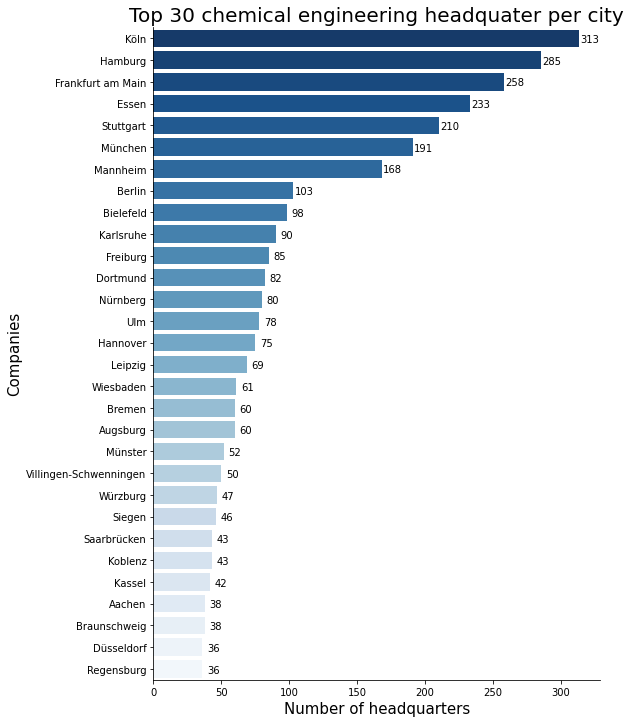

In [188]:
topheadquatersbycity=Company_Name_City_addrs.groupby('City')['Company'].count().sort_values(ascending=False)[:30]
topheadquatersbycity = pd.DataFrame (topheadquatersbycity)
topheadquatersbycity = topheadquatersbycity.rename(columns = {'Company':'N_job'})
topheadquatersbycity['Company_city'] = topheadquatersbycity.index
topheadquatersbycity.reset_index(drop=True, inplace=True)
topheadquatersbycity

plt.figure(figsize=(8, 12))
splot=sns.barplot(x="N_job", y="Company_city", data=topheadquatersbycity,  palette="Blues_r")
sns.despine()
plt.title('Top 30 chemical engineering headquater per city',size=20)
plt.xlabel('Number of headquarters',size=15)
plt.ylabel('Companies',size=15)

# Annotate every single Bar with its value, based on its width
for p in splot.patches:
    splot.annotate(format(p.get_width(), '.0f'),#+"B",
                   (8 + p.get_width(), p.get_y()+0.55*p.get_height()),
                   ha='center', va='center',
                   size=10,
                   xytext=(0, 0),
                   textcoords='offset points')
plt.show()

### <span style='color:DarkBlue'> Text mining data visualization of extracted information from *de.indeed.com*</span> 

In [4]:
for i, row in Indeen_job_list.iterrows():
    text=Indeen_job_list.at[i,'Job_desc']
    try: 
        if ("German" in text) == True:
            Indeen_job_list.at[i,'German']= "Yes"
        else:
            Indeen_job_list.at[i,'German']= "No"
    except:
        Indeen_job_list.at[i,'German']= "Yes"
Indeen_job_list=Indeen_job_list.convert_dtypes()
Indeen_job_list.groupby('German')['German'].count()

German
No     367
Yes    452
Name: German, dtype: int64

In [ ]:
import wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

# Job_list = Job_list.rename(columns = {'Job Summary':'Job_Summary'})
text = " ".join(review for review in Job_list.Job_desc.astype(str))

stopwords = set(STOPWORDS)

# jobdescrip
stopwords.update(["div", "jobSectionHeader","job","br","will","h3 class","new","need","plus","level","h3 class","h4","class","time","ensure","mantail","review","client","within","well","engineer","including","required","written","part","area"."year"])
# summary 
#stopwords.update(["chemical", "process","engineering","germany","new","mechanical","electrical","application","wihtin","industry","well","take","year","processes","role","recruitment","part","task","looking","service","end","BASF","one"])

# Converting jpg image to a numpy array

germany_map = np.array(Image.open("germany_map.png"))

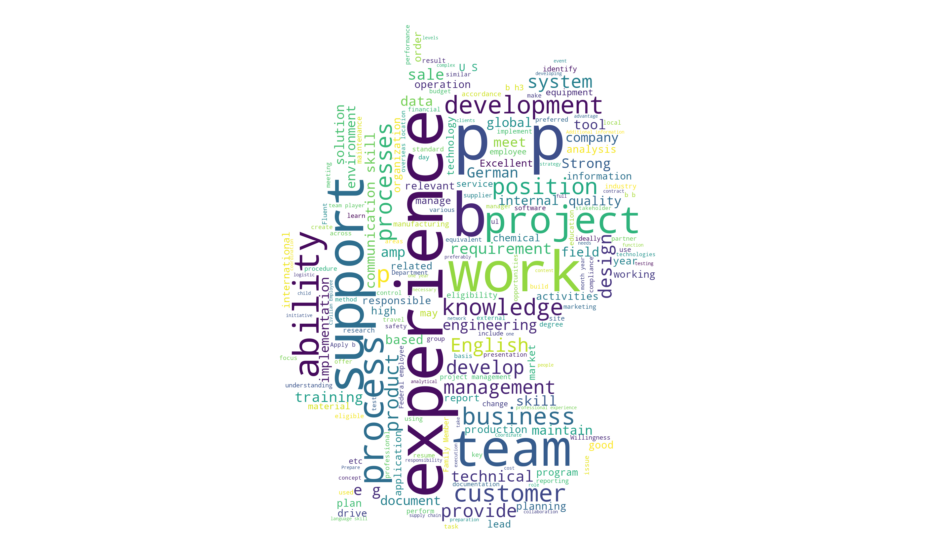

In [114]:
# Create a word cloud image

wc = WordCloud(background_color="white", max_words=200, mask=germany_map,stopwords=stopwords)#min_word_length=2,contour_width=.5, contour_color='black')
# Generate a wordcloud
wc.generate(text)

# show
plt.figure(figsize=[20,10])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [93]:
# Function to fund the frequency of all the words
def printFrequency(text):
    M = {}
     
    # string for storing the words
    word = ""
     
    for i in range(len(text)):
         
        # Check if current character
        # is blank space then it
        # means we have got one word
        if (text[i] == ' '):
             
            # If the current word    
            # is not found then insert
            # current word with frequency 1
            if (word not in M):
                M[word] = 1
                word = ""
             
            # update the frequency
            else:
                M[word] += 1
                word = ""
         
        else:
            word += text[i]
     
    # Storing the last word of the string
    if (word not in M):
        M[word] = 1
     
    # Update the frequency
    else:
        M[word] += 1
         
    # Traverse the map
    # to prthe frequency
    for it in M:
        print(it, "-", M[it])
     
# Driver Code

listwords_summary=printFrequency(text)
#listwords_desc=printFrequency(text)


KYC
,Very - 1
Securities - 1
Equities - 1
preferable
,Strong - 1
analysis
,The - 1
individually
,Fluency - 1
essential; - 1
beneficial
 - 1
focus).,You - 1
internships.,Ideally, - 1
clerk.,You - 1
IT-savvy - 1
knowledge.,You - 1
VBA.,You - 1
challenge.,A - 1
hidden - 2
champions,A - 1
welcomes - 4
arms,A - 1
feel-good - 2
environment,Together - 1
you,Flexible - 1
ratio - 3
strengthening - 2
(communication) - 1
skills.,Develops - 1
linkages - 2
Liaison - 1
lab), - 1
tutors - 1
homework - 2
settings.,Maintains - 1
whereabouts - 1
youth. - 1
coordinates, - 1
children/youth.,Works - 1
center. - 1
needs.,<div><h4 - 1
(Series)</b></h4>
<p>1702 - 1
Technician
</p></div>,<p>Requirements
</p><div>
<h2 - 1
duty
Subject - 2
para.2 - 8
investigation.
The - 1
Crime - 4
maintained.
A - 1
required.
Satisfactory - 1
(transition - 2
annual) - 2
required.
Immunizations - 1
authority.
Already - 1
immune - 2
(based - 2
vaccine - 2
physician - 2
diagnosed - 2
illness), - 2
exemption, - 2
contraindication 

### <span style='color:DarkBlue'> Vizualize the data for the companies and job location</span> 

In [62]:
Germany_map = folium.Map(location=[50.00, 6.00],zoom_start=6,tiles='Stamen Toner')

companies = folium.map.FeatureGroup()

for lat, lng in zip(Company_Name_City_addrs.lat, Company_Name_City_addrs.lng):
    companies.add_child(
    folium.features.CircleMarker(
    [lat, lng], # longitude and latitude value of crimes
    radius=1, # define how big you want the circle markers to be
    color= '#30678D', # color of marker
    #fill=True, # if you want to fill secondary color
    #fill_color='yellow', # inner color of marker
    #fill_opacity=1 # visibility of inner color
    )
    )
    Germany_map.add_child(companies) # Adding all the incidents to map.

job = folium.map.FeatureGroup()

for lat, lng in zip(Indeen_job_list.lat, Indeen_job_list.lng):
    job.add_child(
    folium.features.CircleMarker(
    [lat, lng], # longitude and latitude value of crimes
    radius=1, # define how big you want the circle markers to be
    color= 'Darkorange', # color of marker
    #fill=True, # if you want to fill secondary color
    #fill_color='yellow', # inner color of marker
    #fill_opacity=1 # visibility of inner color
    )
    )
    Germany_map.add_child(job) # Adding all the incidents to map.


Germany_map

### <span style='color:DarkBlue'> Web scrap data from *researchgermany.com* </span>  

In [130]:
# Select the website where the information is extracted
url = "https://www.researchgermany.com/product/top-chemistry-companies-germany-list-of-the-largest-chemical-companies/#1595236972082-5389b912-e343"
# Ask for permission
response = requests.get(url)
# Parse the HTML document from the source code using BeautifulSoup
html = BeautifulSoup(response.text, 'html.parser')
# Search for specific html code
text_html= html.find_all('div',{'class':'panel entry-content wc-tab'})[0].find_all('h4')
text_html=text_html[0:10]
# Data preparation
Company_df = pd.DataFrame (text_html,columns=['Company_name'])
TopCompanies_df=Company_df.Company_name.str.split(r"\:|,|€|Billion",-1).tolist()
TopCompanies_df = pd.DataFrame (TopCompanies_df,columns=['position','Company_name','City','Text',"Revenue",'Text1'])
TopCompanies_df = TopCompanies_df.loc[:,['Company_name','City','Revenue']]
TopCompanies_df['Revenue'] = TopCompanies_df['Revenue'].astype(float)

### <span style='color:DarkBlue'> Visualize scraped data from *researchgermany.com* </span>  

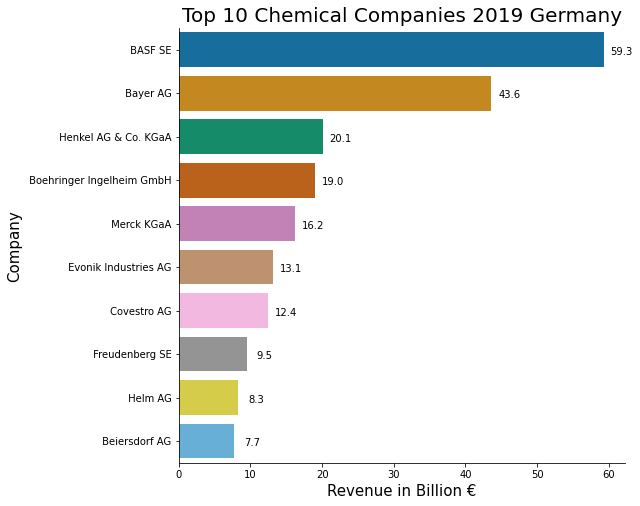

In [131]:
plt.figure(figsize=(8, 8))
splot=sns.barplot(x="Revenue", y="Company_name", data=TopCompanies_df,  palette="colorblind")
sns.despine()
plt.title('Top 10 Chemical Companies 2019 Germany',size=20)
plt.xlabel('Revenue in Billion €',size=15)
plt.ylabel('Company',size=15)
# Annotate every single Bar with its value, based on its width 
for p in splot.patches:
    splot.annotate(format(p.get_width(), '.1f'),#+"B",
                   (2.5+p.get_width(), p.get_y()+0.55*p.get_height()),
                   ha='center', va='center',
                   size=10,
                   xytext=(0, 0),
                   textcoords='offset points')

### <span style='color:DarkBlue'> Web scrap data from *bizvibe.com* </span>  

In [84]:
# Select the website where the information is extracted
url = "https://blog.bizvibe.com/blog/largest-chemical-companies"
# Ask for permission
response = requests.get(url)
# Parse the HTML document from the source code using BeautifulSoup
html = BeautifulSoup(response.text, 'html.parser')
# Search for specific html code
line = html.find('table')
tables =line.find_all('tr')
table =tables[0]
row_table = []
# Extract all the information from the website 
for table in tables:
    
    line1s = table.find_all('td')
    line1 =line1s[0]
    
    row_table1 = []
    row_table.append(row_table1)
    for line1 in line1s:
        record= line1.text
        row_table1.append(record)
# Data preparation
Companies_sales = pd.DataFrame(row_table[1:],columns=row_table[0])
Companies_sales = Companies_sales.rename(columns = {'Rank':'World Rank'})
Companies_sales['Chemical Sales (USD millions)'] = Companies_sales['Chemical Sales (USD millions)'].str.replace(",",".")
Companies_sales = Companies_sales.rename(columns = {'Chemical Sales (USD millions)':'Chemical Sales (USD Billions)'})
Companies_sales = Companies_sales.convert_dtypes()
Headquarters=Companies_sales.Headquarters.str.split(",",expand=True)
Headquarters.columns =['City','Country']
Companies_sales['City']=Headquarters['City']
Companies_sales['Country']=Headquarters['Country']
Companies_sales['Country'] = Companies_sales['Country'].str.strip()
Companies_sales['Chemical Sales (USD Billions)'] = Companies_sales['Chemical Sales (USD Billions)'].astype('float')
Companies_sales['% Sales Increase (YoY)'] = Companies_sales['% Sales Increase (YoY)'].str.replace("n/a","0") 
Companies_sales['% Sales Increase (YoY)'] = Companies_sales['% Sales Increase (YoY)'].astype(float)
Companies_sales['% Sales Increase (YoY)']=Companies_sales['% Sales Increase (YoY)']/10

### <span style='color:DarkBlue'> Visualize scraped data from *bizvibe.com* </span>  

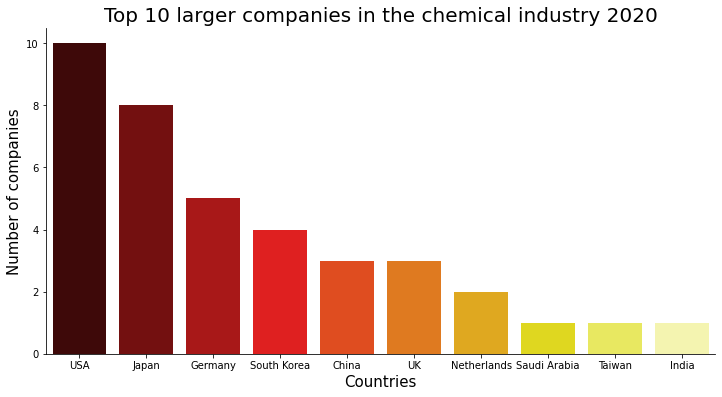

In [85]:
Country_Ncompany=Companies_sales.groupby('Country',sort=False)['Chemical Sales (USD Billions)'].count().head(10)
Country_Ncompany = pd.DataFrame (Country_Ncompany)
Country_Ncompany = Country_Ncompany.rename(columns = {'Chemical Sales (USD Billions)':'N_companies'})
Country_Ncompany['Country'] = Country_Ncompany.index
Country_Ncompany = Country_Ncompany.convert_dtypes()
Country_Ncompany['Country'] = Country_Ncompany['Country'].astype(str)
Country_Ncompany.dtypes

plt.figure(figsize=(12, 6))
sns.barplot(x="Country", y="N_companies", data=Country_Ncompany, palette="hot",order=Country_Ncompany.sort_values('N_companies', ascending=False).Country)
sns.despine()
plt.title('Top 10 larger companies in the chemical industry 2020',size=20)
plt.xlabel('Countries',size=15)
plt.ylabel('Number of companies',size=15)
plt.show()

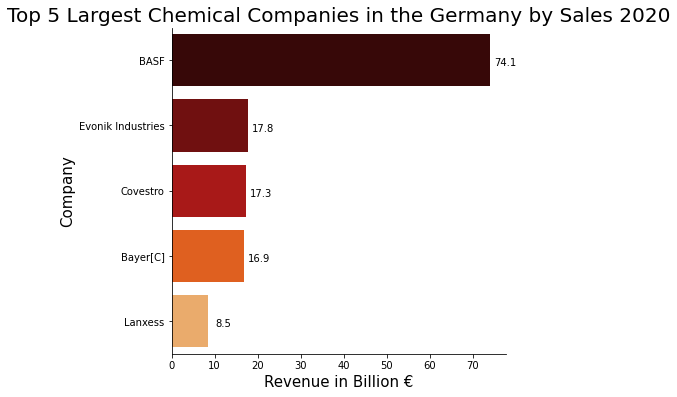

In [82]:
TopfivecompaniesGermany=Companies_sales[Companies_sales['Country'] == "Germany"]

plt.figure(figsize=(6, 6))
splot=sns.barplot(x="Chemical Sales (USD Billions)", y="Company", data=TopfivecompaniesGermany,  palette="gist_heat")
sns.despine()
plt.title('Top 5 Largest Chemical Companies in the Germany by Sales 2020',size=20)
plt.xlabel('Revenue in Billion €',size=15)
plt.ylabel('Company',size=15)
# Annotate every single Bar with its value, based on its width 
for p in splot.patches:
    splot.annotate(format(p.get_width(), '.1f'),#+" B",
                   (3.5+p.get_width(), p.get_y()+0.55*p.get_height()),
                   ha='center', va='center',
                   size=10,
                   xytext=(0, 0),
                   textcoords='offset points')